# **📄 Document type classification **

## Contents
- Prepare Environments
- Import Library & Define Functions
- Hyper-parameters
- Load Data
- Train Model
- Inference & Save File


## 1. Prepare Environments

* 필요한 라이브러리를 설치합니다.

In [53]:
# 필요한 라이브러리 설치
# !pip install timm
# !pip install wandb
# !pip install matplotlib

## 2. Import Library & Define Functions
* 학습 및 추론에 필요한 라이브러리를 로드합니다.
* 학습 및 추론에 필요한 함수와 클래스를 정의합니다.

In [54]:
import os
import time
import random
import copy

import timm
import torch
import pandas as pd
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
from albumentations.pytorch import ToTensorV2
import albumentations as A
from albumentations import ImageOnlyTransform
from augraphy import *
from torch.optim import Adam
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, ConcatDataset

from PIL import Image
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score

import wandb
import matplotlib.pyplot as plt

In [56]:
# 시드를 고정합니다.
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.benchmark = True

In [57]:
# 데이터셋 클래스를 정의합니다.
class ImageDataset(Dataset):
    def __init__(self, csv, path, transform=None, oversample=False):
        self.df = pd.read_csv(csv)
        self.path = path
        self.transform = transform
        self.oversample = oversample

        # 클래스간 불균형 해소를 위한 샘플 증식
        if self.oversample:
            # 각 클래스별로 데이터 수 계산
            class_counts = np.bincount(self.df.values[:, 1].astype(int))

            # # 각 클래스별로 증식할 횟수 설정 (이 예제에서는 최대 데이터 수에 맞춤)
            # max_class_count = max(class_counts)
            # oversample_factors = [max_class_count // count for count in class_counts]
            oversample_factors = [0] * class_counts             
            oversample_factors[3] = 1
            oversample_factors[7] = 1 
            oversample_factors[14] = 2 

            # 각 클래스별로 데이터를 증식한 새로운 데이터 프레임 생성
            oversampled_data = [self.df.values[self.df.values[:, 1] == cls].repeat(factor, axis=0) for cls, factor in enumerate(oversample_factors)]
            oversampled_data = np.vstack(oversampled_data)

            self.df = pd.DataFrame(oversampled_data, columns=self.df.columns)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        name, target = self.df.iloc[idx]
        img = np.array(Image.open(os.path.join(self.path, name)).convert("RGB"))
        
        if self.transform:
            img = self.transform(image=img)['image']
        return img, target
    
# meta.csv 파일 읽기
meta_data = pd.read_csv('data/meta.csv')
label_to_class_name = dict(zip(meta_data['target'], meta_data['class_name']))

In [59]:
# one epoch 학습을 위한 함수
def training(model, dataloader, criterion, optimizer, device, epoch, num_epochs):
    model.train()
    train_loss = 0
    preds_list = []
    targets_list = []

    pbar = tqdm(dataloader)
    for images, labels in pbar:
        images = images.to(device)
        labels = labels.to(device)

        model.zero_grad(set_to_none=True)

        preds = model(images)
        loss = criterion(preds, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        preds_list.extend(preds.argmax(dim=1).detach().cpu().numpy())
        targets_list.extend(labels.detach().cpu().numpy())

        pbar.set_description(f"Epoch [{epoch+1}/{num_epochs}] - Train Loss: {loss.item()}")

    train_loss /= len(dataloader)
    train_acc = accuracy_score(targets_list, preds_list)    
    train_f1 = f1_score(targets_list, preds_list, average='macro')

    return model, train_loss, train_acc, train_f1

def evaluation(model, dataloader, criterion, device, epoch, num_epochs):
    model.eval()  # 모델을 평가 모드로 설정
    valid_loss = 0.0
    preds_list = []
    targets_list = []

    with torch.no_grad(): # model의 업데이트 막기
        tbar = tqdm(dataloader)
        for images, labels in tbar:
            images = images.to(device)
            labels = labels.to(device)

            preds = model(images)
            loss = criterion(preds, labels)

            valid_loss += loss.item()
            preds_list.extend(preds.argmax(dim=1).detach().cpu().numpy())
            targets_list.extend(labels.detach().cpu().numpy())

            tbar.set_description(f"Epoch [{epoch+1}/{num_epochs}] - Valid Loss: {loss.item()}")

    valid_loss = valid_loss / len(dataloader)
    valid_acc = accuracy_score(targets_list, preds_list)  
    valid_f1 = f1_score(targets_list, preds_list, average='macro')

    return valid_loss, valid_acc, valid_f1

def training_loop(model, train_dataloader, valid_dataloader, criterion, optimizer, device, num_epochs, patience, model_name, run):
    best_valid_loss = float('inf')  # 가장 좋은 validation loss를 저장
    early_stop_counter = 0  # 카운터
    valid_max_accuracy = -1
    best_model = None

    for epoch in range(num_epochs):
        model, train_loss, train_acc, train_f1 = training(model, train_dataloader, criterion, optimizer, device, epoch, num_epochs)
        valid_loss, valid_acc, valid_f1 = evaluation(model, valid_dataloader, criterion, device, epoch, num_epochs)

        monitoring_value = {'train_loss': train_loss, 'train_accuracy': train_acc, 'train_f1': train_f1, 
                            'valid_loss': valid_loss, 'valid_accuracy': valid_acc, 'valid_f1': valid_f1}
        
        run.log(monitoring_value, step=epoch)
        
        print(f'''Epoch [{epoch + 1}/{num_epochs}] Finished
        Train Loss: {train_loss}, Train Accuracy: {train_acc}, Train F1: {train_f1}
        Valid Loss: {valid_loss}, Valid Accuracy: {valid_acc}, Valid F1: {valid_f1}''')

        if valid_acc > valid_max_accuracy:
          valid_max_accuracy = valid_acc

        # validation loss가 감소하면 모델 저장 및 카운터 리셋
        if valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            best_model = model
            torch.save(model.state_dict(), f"./model_{model_name}.pt")
            early_stop_counter = 0
            print('Model Saved')

        # validation loss가 증가하거나 같으면 카운터 증가
        else:
            early_stop_counter += 1

        # 조기 종료 카운터가 설정한 patience를 초과하면 학습 종료
        if early_stop_counter >= patience:
            print("Early stopping")
            break

    return best_model, valid_max_accuracy

In [60]:
# 이미지 plotting을 위한 함수
def normalize_image(image):
    # 이미지를 [0, 1] 범위로 정규화
    image_min = image.min()
    image_max = image.max()
    normalized_image = (image - image_min) / (image_max - image_min)
    return normalized_image

def plot_images(images, labels, classes, normalize = True):

    n_images = len(images)
    
    num_rows = n_images // 3  # 행의 개수 계산
    if n_images % 3 != 0:
        num_rows += 1    
    fig, axes = plt.subplots(num_rows, 3, figsize=(30, 10 * num_rows))

    for i in range(n_images):
        image = images[i]
        label = classes[labels[i]]
        row_idx = i // 3
        col_idx = i % 3
        
        if normalize:
            image = normalize_image(image)
        
        axes[row_idx, col_idx].imshow(image.permute(1, 2, 0))
        axes[row_idx, col_idx].set_title(label)
        axes[row_idx, col_idx].axis('off')

    plt.show()

## 3. Hyper-parameters
* 학습 및 추론에 필요한 하이퍼파라미터들을 정의합니다.

In [61]:
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# data config
data_path = 'data/'

# validation config
VALID_RATIO = 0.8

# model config
model_name = 'efficientnet_b5.sw_in12k_ft_in1k'
pretrained_size = 448
pretrained_means = [0.485, 0.456, 0.406]
pretrained_stds= [0.229, 0.224, 0.225]

# training config
LR = 5e-4
EPOCHS = 40
BATCH_SIZE = 16
dropout_ratio = 0.2
patience = 5
num_workers = 0
num_classes = 17

## 4. Load Data
* 학습, 검증, 테스트 데이터셋과 로더를 정의합니다.

In [63]:
# train image 변환을 위한 transform 코드
train_transform = A.Compose([
    # A.Resize(height=pretrained_size, width=pretrained_size), # 이미지 크기 조정
    # 이미지 긴 측면 크기 조절 후 패딩 적용
    A.LongestMaxSize(max_size=pretrained_size, always_apply=True), 
    A.PadIfNeeded(min_height=pretrained_size, min_width=pretrained_size, border_mode=0, value=(255, 255, 255)),
    
    A.Normalize(mean=pretrained_means, std=pretrained_stds), # images normalization
    ToTensorV2() # numpy 이미지나 PIL 이미지를 PyTorch 텐서로 변환
])

# test image 변환을 위한 transform 코드
test_transform = A.Compose([    
    # A.Resize(height=pretrained_size, width=pretrained_size),
    A.LongestMaxSize(max_size=pretrained_size, always_apply=True),
    A.PadIfNeeded(min_height=pretrained_size, min_width=pretrained_size, border_mode=0, value=(255, 255, 255)),
    
    A.Normalize(mean=pretrained_means, std=pretrained_stds),
    ToTensorV2()
])

aug_test_transform = A.Compose([    
    A.RandomRotate90(),
    A.Flip(p=0.5),              
                        
    # A.Resize(height=pretrained_size, width=pretrained_size),
    A.LongestMaxSize(max_size=pretrained_size, always_apply=True),
    A.PadIfNeeded(min_height=pretrained_size, min_width=pretrained_size, border_mode=0, value=(255, 255, 255)),
    
    A.Normalize(mean=pretrained_means, std=pretrained_stds),
    ToTensorV2()
])

# 시각화를 위한 transform 코드
base_transform = A.Compose([
    ToTensorV2()
])

In [64]:
# Training Dataset 정의
train_dataset = ImageDataset(
    data_path + 'aug_train.csv',
    data_path + 'train/',
    transform=train_transform,
    oversample=True
)

# Test Dataset 정의
test_dataset = ImageDataset(
    data_path + 'sample_submission.csv',
    data_path + 'test/',
    transform=test_transform
)

aug_test_dataset = ImageDataset(
    data_path + 'sample_submission.csv',
    data_path + 'test/',
    transform=aug_test_transform
)

# 시각화용 Dataset 정의
train_dataset_v = ImageDataset(
    data_path + 'aug_train.csv',
    data_path + 'train/',
    transform=base_transform
)

test_dataset_v = ImageDataset(
    data_path + 'sample_submission.csv',
    data_path + 'test/',
    transform=base_transform
)

print(len(train_dataset), len(test_dataset))

19328 3140


In [65]:
# 데이터 셋을 학습 데이터 셋과 검증 데이터 셋으로 분리
total_size = len(train_dataset)
train_num, valid_num = int(total_size * VALID_RATIO), total_size - int(total_size * VALID_RATIO)

# train - valid set 나누기
generator = torch.Generator().manual_seed(SEED)
train_dataset, valid_dataset = torch.utils.data.random_split(train_dataset, [train_num, valid_num], generator = generator)

valid_data = copy.deepcopy(valid_dataset)
valid_data.dataset.transform = test_transform

print(f'Train dataset 개수: {len(train_dataset)}')
print(f'Validation dataset 개수: {len(valid_dataset)}')
print(f'Test dataset 개수: {len(test_dataset)}')

Train dataset 개수: 15462
Validation dataset 개수: 3866
Test dataset 개수: 3140


In [66]:
# DataLoader 정의
train_dataloader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=num_workers,
    pin_memory=True,
    drop_last=False
    )

valid_dataloader = DataLoader(
    valid_dataset, 
    batch_size = BATCH_SIZE, 
    shuffle = False,
    num_workers=0,
    pin_memory=True
    )

test_dataloader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    pin_memory=True
    )

aug_test_dataloader = DataLoader(
    aug_test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    pin_memory=True
    )

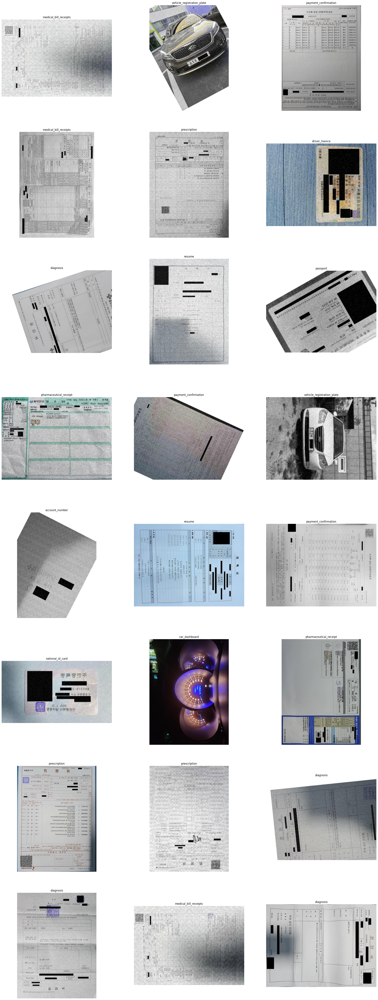

In [67]:
# 변환된 학습 이미지 확인
N_IMAGES = 24

# 무작위로 선택된 인덱스 리스트를 생성
selected_indices = random.sample(range(len(train_dataset_v)), N_IMAGES)

images, labels = zip(*[(image, label) for image, label in [train_dataset_v[i] for i in selected_indices]])
# images, labels = zip(*[(image, label) for image, label in [train_dataset_v[i] for i in range(N_IMAGES)]])

plot_images(images, labels, label_to_class_name)

## 5. Train Model
* 모델을 로드하고, 학습을 진행합니다.

In [68]:
class AttentionModule(nn.Module):
    def __init__(self, in_features, out_features):
        super(AttentionModule, self).__init__()
        self.attention = nn.Sequential(
            nn.Linear(in_features, out_features),
            nn.Sigmoid()
        )

    def forward(self, x):
        attention_weights = self.attention(x)
        return x * attention_weights

class CustomEfficientNetB4(nn.Module):
    def __init__(self, num_classes, attention_size=1792):
        super(CustomEfficientNetB4, self).__init__()
        self.base_model = timm.create_model('efficientnet_b4', pretrained=True)
        
        # Remove the existing classifier
        self.base_model.reset_classifier(0, '')

        # Add attention mechanism
        self.attention = AttentionModule(attention_size, attention_size)

        # New classifier with attention
        self.classifier = nn.Linear(attention_size, num_classes)
        
    def forward(self, x):
        x = self.base_model(x)
        
        # Global average pooling
        x = x.mean([2, 3])

        # Apply attention mechanism
        x = self.attention(x)

        # Final classification
        x = self.classifier(x)

        return x

In [70]:
# 모델 생성
# model = CustomEfficientNetB4(num_classes).to(device)
model = timm.create_model(
    model_name,
    pretrained=True,
    num_classes=17
).to(device)
loss_fn = nn.CrossEntropyLoss()
# loss_fn = ContrastiveLoss()
optimizer = Adam(model.parameters(), lr=LR)

In [71]:
model

EfficientNet(
  (conv_stem): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
  (bn1): BatchNormAct2d(
    48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
    (drop): Identity()
    (act): SiLU(inplace=True)
  )
  (blocks): Sequential(
    (0): Sequential(
      (0): DepthwiseSeparableConv(
        (conv_dw): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=48, bias=False)
        (bn1): BatchNormAct2d(
          48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
          (drop): Identity()
          (act): SiLU(inplace=True)
        )
        (se): SqueezeExcite(
          (conv_reduce): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
          (act1): SiLU(inplace=True)
          (conv_expand): Conv2d(12, 48, kernel_size=(1, 1), stride=(1, 1))
          (gate): Sigmoid()
        )
        (conv_pw): Conv2d(48, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn2): BatchNormAct2d(
    

In [72]:
# # Access model weights
# model_weights = model.state_dict()

# # Print or visualize the weights
# for param_tensor in model_weights:
#     print(param_tensor, "\t", model_weights[param_tensor].size())

In [73]:
# # step 1: overfit the training set - overfit a single data point
# img, label = train_dataset[0]
# img = img.unsqueeze(0).to(device)
# label = torch.tensor([label]).to(device)

# for i in range(1000):
#   outputs = model(img) 
#   loss = loss_fn(outputs, label)
#   loss.backward()
#   optimizer.step() # should reach 1.0 accuracy and 0 loss
  
# # Evaluate the model after overfitting
# outputs = model(img)
# loss = loss_fn(outputs, label)
# acc = accuracy_score(label.detach().cpu().numpy(), outputs.argmax(dim=1).detach().cpu().numpy())
# print(f'Loss: {loss.item()}, Accuracy: {acc}')

In [74]:
run = wandb.init(project = 'soyoung', name = 'training')

# wandb에 모델의 weight & bias, graident 시각화
# run.watch(model, loss_fn, log = 'all', log_graph = True)

model, valid_max_accuracy = training_loop(model, train_dataloader, valid_dataloader, loss_fn, optimizer, device, EPOCHS, patience, model_name, run)
print(f'Valid Max Accuracy: {valid_max_accuracy}')

Epoch [1/40] - Valid Loss: 0.8816159963607788: 100%|██████████| 242/242 [00:30<00:00,  7.90it/s]  


Epoch [1/40] Finished
        Train Loss: 0.5868244709133054, Train Accuracy: 0.7436295433967145, Train F1: 0.22273479558458073
        Valid Loss: 0.35583288425749, Valid Accuracy: 0.8693740300051733, Valid F1: 0.8681504749924297
Model Saved


Epoch [2/40] - Valid Loss: 0.1237046867609024: 100%|██████████| 242/242 [00:30<00:00,  7.90it/s]   


Epoch [2/40] Finished
        Train Loss: 0.2343561036481918, Train Accuracy: 0.9080325960419092, Train F1: 0.9075064571213348
        Valid Loss: 0.2545352840771098, Valid Accuracy: 0.905069839627522, Valid F1: 0.905361125143538
Model Saved


Epoch [3/40] - Valid Loss: 0.011723913252353668: 100%|██████████| 242/242 [00:31<00:00,  7.81it/s] 


Epoch [3/40] Finished
        Train Loss: 0.1322946078922925, Train Accuracy: 0.9512999611951882, Train F1: 0.9509828855335272
        Valid Loss: 0.10001591817102556, Valid Accuracy: 0.9643041903776514, Valid F1: 0.964571804750327
Model Saved


Epoch [4/40] - Valid Loss: 0.036901604384183884: 100%|██████████| 242/242 [00:30<00:00,  7.84it/s] 


Epoch [4/40] Finished
        Train Loss: 0.10485610420538874, Train Accuracy: 0.9617125856939593, Train F1: 0.961494905639192
        Valid Loss: 0.0824705148769989, Valid Accuracy: 0.9705121572684946, Valid F1: 0.9706913380017484
Model Saved


Epoch [5/40] - Train Loss: 0.00012020087888231501: 100%|██████████| 967/967 [05:21<00:00,  3.01it/s]
Epoch [5/40] - Valid Loss: 0.003981411457061768: 100%|██████████| 242/242 [00:30<00:00,  7.95it/s]  


Epoch [5/40] Finished
        Train Loss: 0.08323576813958727, Train Accuracy: 0.9721898848790583, Train F1: 0.972001857056975
        Valid Loss: 0.03364904988159628, Valid Accuracy: 0.9891360579410243, Valid F1: 0.9891237498251025
Model Saved


Epoch [6/40] - Valid Loss: 0.23431894183158875: 100%|██████████| 242/242 [00:30<00:00,  7.81it/s]   


Epoch [6/40] Finished
        Train Loss: 0.06725335968277149, Train Accuracy: 0.9763290648040357, Train F1: 0.9762032148733509
        Valid Loss: 0.0652694866198582, Valid Accuracy: 0.979048111743404, Valid F1: 0.9791569241916673


Epoch [7/40] - Valid Loss: 0.05832306668162346: 100%|██████████| 242/242 [00:30<00:00,  7.96it/s]  


Epoch [7/40] Finished
        Train Loss: 0.05352562256467699, Train Accuracy: 0.9813736903376019, Train F1: 0.9812905471743275
        Valid Loss: 0.1614695259440625, Valid Accuracy: 0.9474909467149508, Valid F1: 0.9475178091437707


Epoch [8/40] - Valid Loss: 0.0016077898908406496: 100%|██████████| 242/242 [00:30<00:00,  7.92it/s] 


Epoch [8/40] Finished
        Train Loss: 0.041982580541446136, Train Accuracy: 0.9857715690078903, Train F1: 0.9856899024212575
        Valid Loss: 0.02772921889951354, Valid Accuracy: 0.9896533885152613, Valid F1: 0.9897358663928898
Model Saved


Epoch [9/40] - Valid Loss: 0.001570562133565545: 100%|██████████| 242/242 [00:30<00:00,  7.84it/s]  


Epoch [9/40] Finished
        Train Loss: 0.050128221470639396, Train Accuracy: 0.9811796662786185, Train F1: 0.9810905148485226
        Valid Loss: 0.03562842355662431, Valid Accuracy: 0.987325400931195, Valid F1: 0.9873762899122944


Epoch [10/40] - Train Loss: 0.00019270555640105158: 100%|██████████| 967/967 [05:21<00:00,  3.01it/s]
Epoch [10/40] - Valid Loss: 0.004861629568040371: 100%|██████████| 242/242 [00:30<00:00,  7.87it/s]  


Epoch [10/40] Finished
        Train Loss: 0.049012160509723374, Train Accuracy: 0.9827965334368128, Train F1: 0.982699443938047
        Valid Loss: 0.009947782208217718, Valid Accuracy: 0.9958613554061045, Valid F1: 0.9958913177687423
Model Saved


Epoch [11/40] - Train Loss: 0.00021179263421799988: 100%|██████████| 967/967 [05:21<00:00,  3.01it/s]
Epoch [11/40] - Valid Loss: 0.005269193090498447: 100%|██████████| 242/242 [00:31<00:00,  7.79it/s]  


Epoch [11/40] Finished
        Train Loss: 0.03172467229182162, Train Accuracy: 0.9890053033242788, Train F1: 0.9889471693733135
        Valid Loss: 0.02781077051854068, Valid Accuracy: 0.9914640455250905, Valid F1: 0.9915067624699839


Epoch [12/40] - Train Loss: 0.00010632452176650986: 100%|██████████| 967/967 [05:21<00:00,  3.01it/s]
Epoch [12/40] - Valid Loss: 0.0007311654626391828: 100%|██████████| 242/242 [00:30<00:00,  7.96it/s] 


Epoch [12/40] Finished
        Train Loss: 0.02731606426887257, Train Accuracy: 0.9910102186004398, Train F1: 0.9909685675279127
        Valid Loss: 0.10457622334253064, Valid Accuracy: 0.9730988101396792, Valid F1: 0.9733088441793325


Epoch [13/40] - Train Loss: 0.00012247612175997347: 100%|██████████| 967/967 [05:21<00:00,  3.01it/s]
Epoch [13/40] - Valid Loss: 9.99083713395521e-05: 100%|██████████| 242/242 [00:30<00:00,  7.81it/s]  


Epoch [13/40] Finished
        Train Loss: 0.023337832095420678, Train Accuracy: 0.9919156642090285, Train F1: 0.9918632099569763
        Valid Loss: 0.02390212954234078, Valid Accuracy: 0.9927573719606829, Valid F1: 0.9927986541897695


Epoch [14/40] - Train Loss: 0.00023848679848015308: 100%|██████████| 967/967 [05:21<00:00,  3.01it/s]
Epoch [14/40] - Valid Loss: 0.0005652349791489542: 100%|██████████| 242/242 [00:30<00:00,  7.93it/s] 


Epoch [14/40] Finished
        Train Loss: 0.030169275034794604, Train Accuracy: 0.9903634717371621, Train F1: 0.990322803032898
        Valid Loss: 0.007101377953269796, Valid Accuracy: 0.9976720124159337, Valid F1: 0.9976910863205483
Model Saved


Epoch [15/40] - Train Loss: 0.009363200515508652: 100%|██████████| 967/967 [05:20<00:00,  3.01it/s]  
Epoch [15/40] - Valid Loss: 0.0006965020438656211: 100%|██████████| 242/242 [00:30<00:00,  7.83it/s] 


Epoch [15/40] Finished
        Train Loss: 0.017317993892270605, Train Accuracy: 0.9953434225844005, Train F1: 0.9953227140712636
        Valid Loss: 0.03468737020168125, Valid Accuracy: 0.9855147439213657, Valid F1: 0.9856102635541576


Epoch [16/40] - Train Loss: 3.576276128569589e-07: 100%|██████████| 967/967 [05:21<00:00,  3.01it/s] 
Epoch [16/40] - Valid Loss: 1.8369635654380545e-05: 100%|██████████| 242/242 [00:30<00:00,  7.89it/s]


Epoch [16/40] Finished
        Train Loss: 0.026368047665579604, Train Accuracy: 0.9906868451688009, Train F1: 0.9906338727115699
        Valid Loss: 0.011379581661994145, Valid Accuracy: 0.9974133471288154, Valid F1: 0.9974344071937616


Epoch [17/40] - Train Loss: 0.00010801266034832224: 100%|██████████| 967/967 [05:21<00:00,  3.01it/s]
Epoch [17/40] - Valid Loss: 0.0006398899131454527: 100%|██████████| 242/242 [00:31<00:00,  7.78it/s] 


Epoch [17/40] Finished
        Train Loss: 0.01300444645246674, Train Accuracy: 0.9959254947613504, Train F1: 0.9958944862957008
        Valid Loss: 0.01263211957964422, Valid Accuracy: 0.9958613554061045, Valid F1: 0.9958789698407754


Epoch [18/40] - Valid Loss: 0.11796878278255463: 100%|██████████| 242/242 [00:30<00:00,  7.94it/s]   


Epoch [18/40] Finished
        Train Loss: 0.020654039562408223, Train Accuracy: 0.9934031819945673, Train F1: 0.9933799403639068
        Valid Loss: 0.1040172600941866, Valid Accuracy: 0.9746508018623901, Valid F1: 0.9747324520530259


Epoch [19/40] - Train Loss: 0.00024327199207618833: 100%|██████████| 967/967 [05:21<00:00,  3.01it/s]
Epoch [19/40] - Valid Loss: 0.00015288800932466984: 100%|██████████| 242/242 [00:30<00:00,  7.90it/s]


Epoch [19/40] Finished
        Train Loss: 0.018649558231467484, Train Accuracy: 0.9938559047988618, Train F1: 0.9938259946298689
        Valid Loss: 0.007035680219267821, Valid Accuracy: 0.9984480082772892, Valid F1: 0.9984574678230289
Model Saved


Epoch [20/40] - Train Loss: 0.12762658298015594: 100%|██████████| 967/967 [05:20<00:00,  3.01it/s]   
Epoch [20/40] - Valid Loss: 1.0776051567518152e-05: 100%|██████████| 242/242 [00:30<00:00,  7.83it/s]


Epoch [20/40] Finished
        Train Loss: 0.013450393899145126, Train Accuracy: 0.9961841935066615, Train F1: 0.9961580912076564
        Valid Loss: 0.0019692057393560967, Valid Accuracy: 0.999482669425763, Valid F1: 0.9994794050866692
Model Saved


Epoch [21/40] - Train Loss: 0.08253207057714462: 100%|██████████| 967/967 [05:20<00:00,  3.01it/s]   
Epoch [21/40] - Valid Loss: 0.0006426419713534415: 100%|██████████| 242/242 [00:30<00:00,  7.84it/s] 


Epoch [21/40] Finished
        Train Loss: 0.01871795451461235, Train Accuracy: 0.994049928857845, Train F1: 0.9940265924098397
        Valid Loss: 0.009305405955012896, Valid Accuracy: 0.9968960165545784, Valid F1: 0.996923936811108


Epoch [22/40] - Train Loss: 0.0013410834362730384: 100%|██████████| 967/967 [05:21<00:00,  3.01it/s] 
Epoch [22/40] - Valid Loss: 3.6166777135804296e-05: 100%|██████████| 242/242 [00:30<00:00,  7.88it/s]


Epoch [22/40] Finished
        Train Loss: 0.014015195142506142, Train Accuracy: 0.9967015909972836, Train F1: 0.9966929849087709
        Valid Loss: 0.0033258009187828383, Valid Accuracy: 0.9992240041386445, Valid F1: 0.9992285414898959


Epoch [23/40] - Train Loss: 0.00013706169556826353: 100%|██████████| 967/967 [05:21<00:00,  3.01it/s]
Epoch [23/40] - Valid Loss: 0.03942475467920303: 100%|██████████| 242/242 [00:30<00:00,  7.97it/s]   


Epoch [23/40] Finished
        Train Loss: 0.015530504834281308, Train Accuracy: 0.9952140732117449, Train F1: 0.9951738795312887
        Valid Loss: 0.016002649347563208, Valid Accuracy: 0.9953440248318676, Valid F1: 0.9953540230501939


Epoch [24/40] - Train Loss: 0.0010891136480495334: 100%|██████████| 967/967 [05:21<00:00,  3.01it/s] 
Epoch [24/40] - Valid Loss: 0.00023981896811164916: 100%|██████████| 242/242 [00:30<00:00,  7.92it/s]


Epoch [24/40] Finished
        Train Loss: 0.009097224067396242, Train Accuracy: 0.9970896391152503, Train F1: 0.9970753658728696
        Valid Loss: 0.005793605939819181, Valid Accuracy: 0.9979306777030522, Valid F1: 0.9979505272349902


Epoch [25/40] - Train Loss: 0.00010846267832675949: 100%|██████████| 967/967 [05:21<00:00,  3.01it/s]
Epoch [25/40] - Valid Loss: 0.0009913233807310462: 100%|██████████| 242/242 [00:31<00:00,  7.77it/s] 

Epoch [25/40] Finished
        Train Loss: 0.016268840536406218, Train Accuracy: 0.9945026516621395, Train F1: 0.9944862220517869
        Valid Loss: 0.01711845827756003, Valid Accuracy: 0.9950853595447491, Valid F1: 0.9950885201143235
Early stopping
Valid Max Accuracy: 0.999482669425763


In [75]:
# run.unwatch()
run.finish()

train_accuracy,▁▆▇▇▇▇███████████████████
train_f1,▁▇███████████████████████
train_loss,█▄▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▁▃▆▆▇▇▅▇▇██▇██▇██▇███████
valid_f1,▁▃▆▆▇▇▅▇▇██▇██▇██▇███████
valid_loss,█▆▃▃▂▂▄▂▂▁▂▃▁▁▂▁▁▃▁▁▁▁▁▁▁
train_accuracy,0.9945
train_f1,0.99449
train_loss,0.01627
valid_accuracy,0.99509
valid_f1,0.99509


In [76]:
torch.cuda.empty_cache()

# 6. Inference & Save File
* 테스트 이미지에 대한 추론을 진행하고, 결과 파일을 저장합니다.

In [77]:
# model.load_state_dict(torch.load(f'./model_{model_name}.pt'))
# model.to(device)

# preds_list = []

# model.eval()
# for images, _ in tqdm(test_dataloader):
#     images = images.to(device)

#     with torch.no_grad():
#         preds = model(images)
#     preds_list.extend(preds.argmax(dim=1).detach().cpu().numpy())

100%|██████████| 197/197 [00:25<00:00,  7.63it/s]


- Test-Time Augmentation Ensemble
    - 학습 이미지에 RandomRotate90, Flip을 랜덤 적용하여 예측
    - 각 예측 결과 digits의 평균을 구해 앙상블 

In [109]:
model.load_state_dict(torch.load(f'./model_{model_name}.pt'))
model.to(device)

N_TTA = 30
preds_list = []
with torch.no_grad():
    loaders = [test_dataloader] + [aug_test_dataloader] * N_TTA

    for batches in tqdm(zip(*loaders), total=len(test_dataloader)):
        images, *aug_images = [images.to(device) for images, _ in batches]

        outputs_original = model(images)
        outputs_augmented = [model(aug_image) for aug_image in aug_images]

        final_outputs = (outputs_original + sum(outputs_augmented)) / N_TTA + 1
        preds_list.extend(final_outputs.argmax(dim=1).cpu().numpy())

# 예측 결과 확인
print("Ensemble Predictions:", preds_list)

100%|██████████| 197/197 [14:38<00:00,  4.46s/it]

Ensemble Predictions: [3, 14, 3, 3, 3, 3, 3, 3, 7, 3, 3, 7, 3, 3, 7, 7, 3, 3, 7, 3, 3, 7, 14, 3, 3, 7, 14, 3, 14, 3, 3, 7, 7, 3, 7, 3, 7, 14, 3, 3, 7, 3, 3, 3, 3, 3, 3, 7, 3, 7, 3, 3, 3, 7, 7, 3, 3, 3, 7, 7, 14, 7, 3, 7, 3, 7, 3, 7, 3, 3, 14, 3, 3, 7, 7, 3, 3, 3, 14, 7, 3, 3, 3, 7, 14, 3, 3, 7, 3, 14, 3, 7, 7, 7, 3, 3, 3, 7, 14, 3, 14, 7, 7, 7, 3, 3, 3, 3, 7, 7, 3, 3, 14, 14, 7, 3, 3, 7, 3, 14, 3, 3, 7, 3, 3, 3, 14, 7, 3, 3, 7, 14, 7, 3, 3, 7, 3, 3, 3, 3, 7, 7, 7, 3, 3, 7, 3, 3, 3, 3, 7, 3, 3, 14, 3, 3, 3, 7, 3, 3, 7, 7, 3, 3, 3, 7, 3, 3, 3, 7, 3, 3, 3, 3, 3, 7, 7, 3, 7, 7, 3, 3, 3, 3, 3, 7, 3, 3, 3, 3, 14, 3, 3, 7, 14, 3, 7, 3, 3, 14, 14, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 14, 7, 7, 3, 3, 7, 3, 7, 7, 7, 7, 3, 14, 7, 3, 3, 14, 3, 3, 14, 7, 3, 3, 3, 3, 3, 3, 7, 3, 14, 3, 3, 3, 3, 7, 3, 3, 3, 3, 3, 14, 7, 14, 3, 7, 3, 3, 14, 3, 7, 7, 7, 3, 7, 7, 3, 3, 14, 3, 7, 7, 7, 3, 3, 14, 3, 3, 3, 3, 3, 7, 7, 3, 3, 7, 3, 3, 7, 3, 7, 3, 7, 7, 7, 3, 14, 3, 3, 14, 3, 3, 7, 7, 3, 7, 3, 3, 3, 3, 7, 3, 3, 7

In [110]:
pred_df = pd.DataFrame(test_dataset.df, columns=['ID', 'target'])
pred_df['target'] = preds_list

In [111]:
sample_submission_df = pd.read_csv(data_path + 'sample_submission.csv')
assert (sample_submission_df['ID'] == pred_df['ID']).all()

In [112]:
pred_df.to_csv("3_7_14_pred.csv", index=False)

In [113]:
pred_df.head()

,ID,target
0,0008fdb22ddce0ce.jpg,3
1,00091bffdffd83de.jpg,14
2,00396fbc1f6cc21d.jpg,3
3,00471f8038d9c4b6.jpg,3
4,00901f504008d884.jpg,3


In [114]:
pred_37 = pd.read_csv('3_7_14_pred.csv')
pred_df = pd.read_csv('ensemble_9593_9603_9562_3_final.csv')

index_37 = pred_df[pred_df['target'].isin([3, 7, 14])].index
pred_df.loc[index_37, 'target'] = pred_37.loc[index_37, 'target']

pred_df.head()

,ID,target
0,0008fdb22ddce0ce.jpg,2
1,00091bffdffd83de.jpg,12
2,00396fbc1f6cc21d.jpg,5
3,00471f8038d9c4b6.jpg,12
4,00901f504008d884.jpg,2


In [115]:
pred_df.to_csv("pred_with_3_7_14_cls.csv", index=False)

# 7. Prediction Examination

* 테스트 이미지 시각화

index:  [1525, 3035, 2693, 1649, 500, 1804, 2975, 2410, 2789, 3056, 144, 2374, 1143, 1376, 737, 1024, 1983, 2209, 2125, 1146]


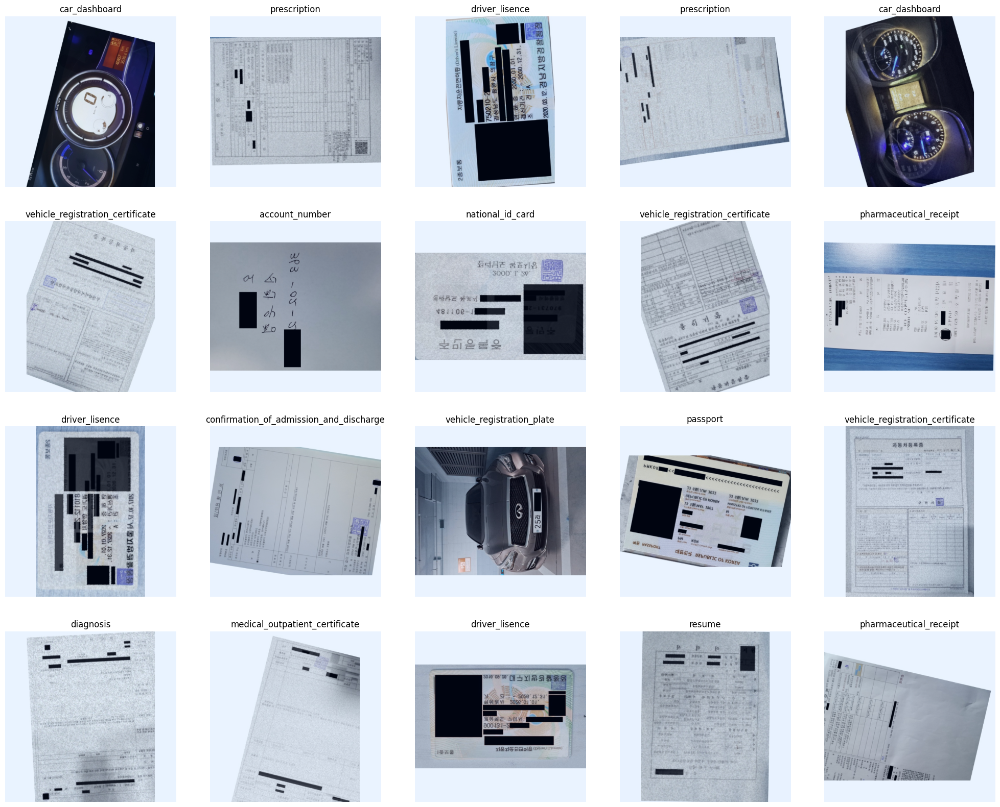

In [85]:
# 시각화할 이미지 개수
img_count = 20

# 데이터셋의 총 길이를 가져옴
dataset_len = len(test_dataset)

# 무작위로 선택된 인덱스 리스트를 생성
selected_indices = random.sample(range(dataset_len), img_count)
print("index: ", selected_indices)

# 로컬에서 이미지 플로팅
num_rows = img_count // 5  # 행의 개수 계산
if img_count % 5 != 0:
    num_rows += 1    
fig, axes = plt.subplots(num_rows, 5, figsize=(25, 5 * num_rows))

# for i, idx in enumerate(selected_indices):
for i in range(img_count):
    test_dataset.df = pred_df
    image, label = test_dataset[i]
    row_idx = i // 5  
    col_idx = i % 5 
    
    # image = np.clip(image, 0, 1)  # 값이 0보다 작으면 0, 1보다 크면 1로 클리핑
    image = normalize_image(image)
    
    axes[row_idx, col_idx].imshow(image.permute(1, 2, 0))
    axes[row_idx, col_idx].set_title(label_to_class_name[label])
    axes[row_idx, col_idx].axis('off')

plt.show()